In [86]:
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ydata_profiling import ProfileReport
import sweetviz as sv
import streamlit as st
from PIL import  Image
from IPython.display import IFrame

## This statement allows the visuals to render within your Jupyter Notebook.
%matplotlib inline

In [134]:
!streamlit run your_script.py


Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: your_script.py


## Loading the data
We can now load the dataset into pandas using the read_csv() function. This converts the CSV file into a Pandas dataframe.

In [2]:
#Read in the csv file and convert to a Pandas dataframe
job=pd.read_csv("Jadarat_data.csv")


### Viewing the dataframe
We can get a quick sense of the size of our dataset by using the shape method. This returns a tuple with the number of rows and columns in the dataset.

In [3]:
job.shape

(1470, 18)

In [4]:
job.head()

,job_title,job_date,job_desc,job_tasks,comp_name,comp_no,comp_type,comp_size,eco_activity,qualif,region,city,benefits,contract,positions,job_post_id,exper,gender
0,محاسب,27/05/1444,['إعداد وتنظيم مستندات الصرف ومتابعة تحصيل الإ...,[' تدقيق المطالبات المالية والتأكد من اكتمال...,شركة مقر العالم للسفريات,1-317262,خاص,متوسطة فئة أ,أنشطة وكالات السياحة والسفر,"['Language data', 'اللغة الانجليزية', 'محترف']",الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,20202026350419,0 Years,both
1,بائع,27/05/1444,['بيع مجموعة من السلع والخدمات للعملاء، وتوفير...,"[' بيع مجموعة من السلع والخدمات للعملاء.', '...",شركة عالم الكهرباء للمقاولات,4-1324428,خاص,متوسطة فئة ب,تركيب انظمة التبريد وتكييف الهواء وصيانتها واص...,NaN,المنطقة الشرقية,AD DAMMAM...,"['Salary', '5000.0']",دوام كامل,0 / 3,20202026350389,0 Years,both
2,أخصائي عمليات موارد بشرية,27/05/1444,['تنفيذ الإجراءات والأنظمة والنماذج الخاصة بمر...,[' تنفيذ الإجراءات والأنظمة والنماذج الخاصة ...,شركه دار السلام,1-155294,خاص,متوسطة فئة أ,ترميمات المباني السكنية والغير سكنية,"['Language data', 'الانجليزيه', 'محترف']",الرياض,ATH THUMA...,"['Salary', '4000.0']",دوام كامل,0 / 2,20202026350347,2 Years,both
3,ميكانيكي سيارات,27/05/1444,['تشخيص أعطال السيارات وإصلاحها وتنفيذ برامج ا...,[' فحص أداء المعدّات الكهربائية والميكانيكية...,مؤسسة لمكو لغيار الزيوت,8-1925495,خاص,صغيرة فئة ب,NaN,"['Skill data', 'صيانة السيارات وتقييم الاعطال'...",المنطقة الشرقية,AL HUFUF...,"['Salary', '5000.0']",دوام كامل,0 / 10,20202026350219,0 Years,M
4,محاسب,27/05/1444,['إعداد وتنظيم مستندات الصرف ومتابعة تحصيل الإ...,[' تدقيق المطالبات المالية والتأكد من اكتمال...,مؤسسة فكرة اليمامة للمقاولات,1-2356639,خاص,كبيرة,الإنشاءات العامة للمباني السكنية,"['Skill data', 'تحمل ضغط العمل', 'محترف', 'Lan...",الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,20202026350043,0 Years,both


## 1. Data Profiling:
Data profiling is a comprehensive process of examining the data available in an existing dataset and collecting statistics and information about that data. 

In [5]:
jobs_report = job.profile_report(
    explorative=True, html={"style": {"full_width": True}}
)
jobs_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The process of profiling differs slightly for categorical and numerical variables due to their inherent differences.

**The two main types of data are:**
- Quantitative (numerical) data
- Qualitative (categorical) data

### Data Quality Checks
Data quality checks involve the process of ensuring that the data is accurate, complete, consistent, relevant, and reliable. 


**Here are typical steps involved in checking data quality:**

#### 1. Reliability:
Evaluate the data's source and collection process to determine its trustworthiness.

In [6]:
#it is reliable

#### 2. Timeliness: 
Ensure the data is up-to-date and reflective of the current situation or the period of interest for the analysis.

In [7]:
#two years ago

#### 3. Consistency: 

Confirm that the data is consistent within the dataset and across multiple data sources. For example, the same data point should not have different values in different places.


In [8]:
#one data set

#### 4. Relevance: 
Assess whether the data is appropriate and applicable for the intended analysis. Data that is not relevant can skew results and lead to incorrect conclusions.

**Key considerations for relevance include:**

> 1. Sample Appropriateness: Confirm that your data sample aligns with your analysis objectives. For instance, utilizing data from the Northern region will not yield accurate insights for the Western region of the Kingdom.
>
> 2. Variable Selection: Any column will not be relevant for our analysis, we can get rid of these using the drop() method. We will set the “axis” argument to 1 since we’re dealing with columns, and set the “inplace” argument to True to make the change permanent.


In [9]:
job.head(2)

,job_title,job_date,job_desc,job_tasks,comp_name,comp_no,comp_type,comp_size,eco_activity,qualif,region,city,benefits,contract,positions,job_post_id,exper,gender
0,محاسب,27/05/1444,['إعداد وتنظيم مستندات الصرف ومتابعة تحصيل الإ...,[' تدقيق المطالبات المالية والتأكد من اكتمال...,شركة مقر العالم للسفريات,1-317262,خاص,متوسطة فئة أ,أنشطة وكالات السياحة والسفر,"['Language data', 'اللغة الانجليزية', 'محترف']",الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,20202026350419,0 Years,both
1,بائع,27/05/1444,['بيع مجموعة من السلع والخدمات للعملاء، وتوفير...,"[' بيع مجموعة من السلع والخدمات للعملاء.', '...",شركة عالم الكهرباء للمقاولات,4-1324428,خاص,متوسطة فئة ب,تركيب انظمة التبريد وتكييف الهواء وصيانتها واص...,NaN,المنطقة الشرقية,AD DAMMAM...,"['Salary', '5000.0']",دوام كامل,0 / 3,20202026350389,0 Years,both


In [10]:
job.drop(columns=['job_desc', 'job_tasks','comp_no','eco_activity','qualif', 'job_post_id', 'comp_size', 'job_date'], axis=1, inplace=True)

In [11]:
job.head(2)

,job_title,comp_name,comp_type,region,city,benefits,contract,positions,exper,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,0 Years,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM...,"['Salary', '5000.0']",دوام كامل,0 / 3,0 Years,both


In [12]:
jobs_report = job.profile_report(
    explorative=True, html={"style": {"full_width": True}}
)
jobs_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### 5. Uniqueness: 
Check for and remove duplicate records to prevent skewed analysis results.


In [13]:
job.duplicated().sum()

100

In [14]:
job.drop_duplicates(keep="first", inplace=True)

#### 6. Completeness: 
Ensure that no critical data is missing. This might mean checking for null values or required fields that are empty.

We will start by checking the dataset for missing or null values. For this, we can use the isna() method which returns a dataframe of boolean values indicating if a field is null or not. To group all missing values by column, we can include the sum() method.

In [15]:
#Display number missing values per column
job.isnull().sum()


job_title    0
comp_name    0
comp_type    0
region       0
city         0
benefits     0
contract     0
positions    0
exper        0
gender       0
dtype: int64

#### 7. Check Accuracy:

Verify that the data is correct and precise. This could involve comparing data samples with known sources or using validation rules.

**The process includes:**
1. Validating the appropriateness of data types for the dataset.
2. Identifying outliers  using established validation  rule

In [16]:
# check columns types 
job.head(2)

,job_title,comp_name,comp_type,region,city,benefits,contract,positions,exper,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,0 Years,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM...,"['Salary', '5000.0']",دوام كامل,0 / 3,0 Years,both


In [275]:
job.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1370 entries, 0 to 1468
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   job_title  1370 non-null   object
 1   comp_name  1370 non-null   object
 2   comp_type  1370 non-null   object
 3   region     1370 non-null   object
 4   city       1370 non-null   object
 5   benefits   1370 non-null   object
 6   contract   1370 non-null   object
 7   positions  1370 non-null   object
 8   exper      1370 non-null   object
 9   gender     1370 non-null   object
dtypes: object(10)
memory usage: 117.7+ KB


In [276]:
# go to clean them 

In [277]:
# check outliers 

**What is an Outlier?** 
Outlier is an row/observation that appears far away and diverges from an overall pattern in a sample.

**What are the types of Outliers?**
1. Univariate: These outliers can be found when we look at distribution of a single variable
2. Multivariate: are outliers in an n-dimensional space. In order to find them, you have to look at distributions in multi-dimensions. example (hight=100, weight=100) for a person

**What causes Outliers?**
Whenever we come across outliers, the ideal way to tackle them is to find out the reason of having these outliers. The method to deal with them would then depend on the reason of their occurrence.

Let’s understand various types of outliers:

1. Data Entry Errors:- Human errors such as errors caused during data collection, recording, or entry can cause outliers in data.
2. Measurement Error: It is the most common source of outliers. This is caused when the measurement instrument used turns out to be faulty.
3. Data Processing Error: Whenever we perform data mining, we extract data from multiple sources. It is possible that some manipulation or extraction errors may lead to outliers in the dataset.
4. Sampling error: For instance, we have to measure the height of athletes. By mistake, we include a few basketball players in the sample. This inclusion is likely to cause outliers in the dataset.
5. Natural Outlier: When an outlier is not artificial (due to error), it is a natural outlier. For instance: In my last assignment with one of the renowned insurance company, I noticed that the performance of top 50 financial advisors was far higher than rest of the population. Surprisingly, it was not due to any error. Hence, whenever we perform any data mining activity with advisors, we used to treat this segment separately.


**What is the impact of Outliers on a dataset?**


![image.png](https://www.analyticsvidhya.com/wp-content/uploads/2015/02/Outlier_31.png)



**How to detect Outliers?**

1. Most commonly used method to detect outliers is visualization (Univariate Graphical Analysis).

We use 3 common visualization methods:
>- Box-plot: A box plot is a method for graphically depicting groups of numerical data through their quartiles. The box extends from the Q1 to Q3 quartile values of the data, with a line at the median (Q2). The whiskers extend from the edges of the box to show the range of the data. Outlier points are those past the end of the whiskers. Box plots show robust measures of location and spread as well as providing information about symmetry and outliers.
>
>  
>![image.png](https://miro.medium.com/v2/resize:fit:698/format:webp/1*VK5iHA2AB28HSZwWwUbNYg.png)
>
>
>- Histogram
>- Scatter Plot: A scatter plot is a mathematical diagram using Cartesian coordinates to display values for two variables for a set of data. The data are displayed as a collection of points, each having the value of one variable determining the position on the horizontal axis and the value of the other variable determining the position on the vertical axis. The points that are far from the population can be termed as an outlier.
>
>  
>![image.png](https://miro.medium.com/v2/resize:fit:4800/format:webp/1*Ov6aH-8yIwNoUxtMFwgx4g.png)
>
>

2. Using statistical method (Univariate Non-Graphical analysis):
>- Any value, which is beyond the range of -1.5 x IQR to 1.5 x IQR
 
![image.png](https://www.whatissixsigma.net/wp-content/uploads/2015/07/Box-Plot-Diagram-to-identify-Outliers-figure-1.png)

>- Use capping methods. Any value which out of range of 5th and 95th percentile can be considered as outlier
>- Data points, three or more standard deviation away from mean are considered outlier: The Z-score is the signed number of standard deviations by which the value of an observation or data point is above the mean value of what is being observed or measured. While calculating the Z-score we re-scale and center the data and look for data points that are too far from zero. These data points which are way too far from zero will be treated as the outliers. In most of the cases, a threshold of 3 or -3 is used i.e if the Z-score value is greater than or less than 3 or -3 respectively, that data point will be identified as outliers.
> - Outlier detection is merely a special case of the examination of data for influential data points and it also depends on the business understanding


In [278]:
# go to univariate graphical analysis
# go to lesson : data visualisation 1 - chart type section
# then go to univariate graphical analysis
# detect outliers using graphs varbaly

In [279]:
# go to lesson: statistics 1 then statistics 3
# then go to univariate Non graphical analysis
# detect outliers using numerical statistics 

In [36]:
jobs_report = job.profile_report(
    explorative=True, html={"style": {"full_width": True}}
)
jobs_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
#drop outlier in salary
job=job[job['salary']<20000]

In [38]:
job

,job_title,comp_name,comp_type,region,city,salary,contract,positions,years_of_experience,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH,5000.0,دوام كامل,1,0,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM,5000.0,دوام كامل,3,0,both
2,أخصائي عمليات موارد بشرية,شركه دار السلام,خاص,الرياض,ATH THUMA,4000.0,دوام كامل,2,2,both
3,ميكانيكي سيارات,مؤسسة لمكو لغيار الزيوت,خاص,المنطقة الشرقية,AL HUFUF,5000.0,دوام كامل,10,0,Male
4,محاسب,مؤسسة فكرة اليمامة للمقاولات,خاص,الرياض,AR RIYADH,5000.0,دوام كامل,1,0,both
...,...,...,...,...,...,...,...,...,...,...
1463,بائع,مؤسسة مصلح دخيل الله صالح الثبيتي للتجارة,خاص,مكة المكرمة,MAKKAH AL,4000.0,دوام كامل,1,0,Male
1464,بائع,شركة النجمة الذهبية للتبريد والتكييف شركة شخص ...,خاص,المنطقة الشرقية,AL HUFUF,4000.0,دوام كامل,1,2,Female
1465,مهندس تقنية معلومات,مطعم الاوراق الخضر لتقديم الوجبات,خاص,الرياض,AR RIYADH,5500.0,دوام كامل,1,0,both
1466,سكرتير,شركة ملتقى التجار لحاضنات و مسرعات الأعمال,خاص,مكة المكرمة,JEDDAH,4000.0,دوام كامل,1,2,both


In [282]:
# go to delete ouliers

## 2. Data Cleaning: 

Preliminary findings from data profiling can lead to cleaning the data by:
- Handling missing values
- Correcting errors.
- Dealing with outliers.

-------------------



### Handling missing values:

**Why my data has missing values?**
They may occur at two stages:
1. Data Extraction: It is possible that there are problems with extraction process. Errors at data extraction stage are typically easy to find and can be corrected easily as well.
2. Data collection: These errors occur at time of data collection and are harder to correct.

**Why do we need to handle the missing data?**
To avoid:
- Bias the conclusions.
- Leading the business to make wrong decisions.

**Which are the methods to treat missing values ?**
1. Deletion: we delete rows where any of the variable is missing. Simplicity is one of the major advantage of this method, but this method reduces the power of model because it reduces the sample size.

2. Imputation: is a method to fill in the missing values with estimated ones. This imputation is one of the most frequently used methods.

    2.1. Mean/ Mode/ Median Imputation: It consists of replacing the missing data for a given attribute by the mean or median (quantitative attribute) or mode (qualitative attribute) of all known values of that variable.
    > It can be of two types:
    > - Generalized Imputation: In this case, we calculate the mean or median for all non missing values of that variable then replace missing value with mean or median.
    > - Similar case Imputation: In this case, we calculate average for each group individually of non missing values then replace the missing value based on the group.

    2.2. Constant Value
   
    2.3. Forward Filling
   
    2.4. Backward Filling

6. Prediction Model:  Prediction model is one of the sophisticated method for handling missing data. Here, we create a predictive model to estimate values that will substitute the missing data.  In this case, we divide our data set into two sets: One set with no missing values for the variable and another one with missing values. First data set become training data set of the model while second data set with missing values is test data set and variable with missing values is treated as target variable. Next, we create a model to predict target variable based on other attributes of the training data set and populate missing values of test data set.

> There are 2 drawbacks for this approach:
> - The model estimated values are usually more well-behaved than the true values
> - If there are no relationships with attributes in the data set and the attribute with missing values, then the model will not be precise for estimating missing values.

9. KNN Imputation: In this method of imputation, the missing values of an attribute are imputed using the given number of attributes that are most similar to the attribute whose values are missing. The similarity of two attributes is determined using a distance function. It is also known to have certain advantage & disadvantages.

   > **Advantages:**
   > - k-nearest neighbour can predict both qualitative & quantitative attributes
   > - Creation of predictive model for each attribute with missing data is not required
   > - Attributes with multiple missing values can be easily treated
   > - Correlation structure of the data is taken into consideration

   > **Disadvantage:**
   > - KNN algorithm is very time-consuming in analyzing large database. It searches through all the dataset looking for the most similar instances.
   > - Choice of k-value is very critical. Higher value of k would include attributes which are significantly different from what we need whereas lower value of k implies missing out of significant attributes.

--------------------


In [283]:
# go back to 6th dimention --> Completeness

### Correcting errors

-------------------

Accuracy

In [17]:
job.head(2)

,job_title,comp_name,comp_type,region,city,benefits,contract,positions,exper,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH...,"['Salary', '5000.0']",دوام كامل,0 / 1,0 Years,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM...,"['Salary', '5000.0']",دوام كامل,0 / 3,0 Years,both


In [18]:
job.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1370 entries, 0 to 1468
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   job_title  1370 non-null   object
 1   comp_name  1370 non-null   object
 2   comp_type  1370 non-null   object
 3   region     1370 non-null   object
 4   city       1370 non-null   object
 5   benefits   1370 non-null   object
 6   contract   1370 non-null   object
 7   positions  1370 non-null   object
 8   exper      1370 non-null   object
 9   gender     1370 non-null   object
dtypes: object(10)
memory usage: 117.7+ KB


In [19]:
job['benefits']= job['benefits'].apply(lambda x: float(x.split(',')[1].strip(" []'\"")) if isinstance(x, str) else x)




In [20]:
job.rename(columns={'benefits': "salary"}, inplace=True)

In [21]:
job['salary'].apply(lambda x: float(x))

0       5000.0
1       5000.0
2       4000.0
3       5000.0
4       5000.0
         ...  
1463    4000.0
1464    4000.0
1465    5500.0
1466    4000.0
1468    4000.0
Name: salary, Length: 1370, dtype: float64

In [22]:
job.head(2)

,job_title,comp_name,comp_type,region,city,salary,contract,positions,exper,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH...,5000.0,دوام كامل,0 / 1,0 Years,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM...,5000.0,دوام كامل,0 / 3,0 Years,both


In [23]:
job['positions']=job['positions'].apply(lambda x:x.split("/")[1])

In [24]:
job.head()

,job_title,comp_name,comp_type,region,city,salary,contract,positions,exper,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH...,5000.0,دوام كامل,1,0 Years,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM...,5000.0,دوام كامل,3,0 Years,both
2,أخصائي عمليات موارد بشرية,شركه دار السلام,خاص,الرياض,ATH THUMA...,4000.0,دوام كامل,2,2 Years,both
3,ميكانيكي سيارات,مؤسسة لمكو لغيار الزيوت,خاص,المنطقة الشرقية,AL HUFUF...,5000.0,دوام كامل,10,0 Years,M
4,محاسب,مؤسسة فكرة اليمامة للمقاولات,خاص,الرياض,AR RIYADH...,5000.0,دوام كامل,1,0 Years,both


In [25]:
job['city']=job['city'].apply(lambda x:x.split(".")[0])

In [26]:
job['exper']= job['exper'].apply(lambda x : x.split("Y")[0])

In [27]:
job.rename(columns={'exper': "years_of_experience"}, inplace=True)

In [28]:
job['years_of_experience']=job['years_of_experience'].apply(lambda x: int(x))

In [29]:
job['positions']=job['positions'].apply(lambda x: int(x))

In [30]:
job.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1370 entries, 0 to 1468
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   job_title            1370 non-null   object 
 1   comp_name            1370 non-null   object 
 2   comp_type            1370 non-null   object 
 3   region               1370 non-null   object 
 4   city                 1370 non-null   object 
 5   salary               1370 non-null   float64
 6   contract             1370 non-null   object 
 7   positions            1370 non-null   int64  
 8   years_of_experience  1370 non-null   int64  
 9   gender               1370 non-null   object 
dtypes: float64(1), int64(2), object(7)
memory usage: 117.7+ KB


In [31]:
job.head(2)

,job_title,comp_name,comp_type,region,city,salary,contract,positions,years_of_experience,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,الرياض,AR RIYADH,5000.0,دوام كامل,1,0,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,المنطقة الشرقية,AD DAMMAM,5000.0,دوام كامل,3,0,both


In [32]:
job['gender'].unique()

array(['both', 'M', 'F'], dtype=object)

In [33]:
job['gender'] = job['gender'].replace({'M': 'Male', 'F': 'Female'})

In [35]:
job.tail(5)

,job_title,comp_name,comp_type,region,city,salary,contract,positions,years_of_experience,gender
1463,بائع,مؤسسة مصلح دخيل الله صالح الثبيتي للتجارة,خاص,مكة المكرمة,MAKKAH AL,4000.0,دوام كامل,1,0,Male
1464,بائع,شركة النجمة الذهبية للتبريد والتكييف شركة شخص ...,خاص,المنطقة الشرقية,AL HUFUF,4000.0,دوام كامل,1,2,Female
1465,مهندس تقنية معلومات,مطعم الاوراق الخضر لتقديم الوجبات,خاص,الرياض,AR RIYADH,5500.0,دوام كامل,1,0,both
1466,سكرتير,شركة ملتقى التجار لحاضنات و مسرعات الأعمال,خاص,مكة المكرمة,JEDDAH,4000.0,دوام كامل,1,2,both
1468,مشغل آلة تشطيب رخام,مصنع عبدالرحمن بن محمد بن عبدالعزيز العبدالقاد...,خاص,المنطقة الشرقية,AL KHUBAR,4000.0,دوام كامل,3,0,Male


In [48]:
job['region'].value_counts()

region
الرياض             579
مكة المكرمة        341
المنطقة الشرقية    207
المدينة المنورة     75
الباحة              45
عسير                38
القصيم              30
حائل                18
تبوك                11
نجران                8
جازان                7
الحدود الشمالية      4
الجوف                3
اخرى                 1
Name: count, dtype: int64

In [49]:
job['region'] = job['region'].replace({'الرياض': 'Riyadh', 'مكة المكرمة': 'Makkah', 
                                       'المنطقة الشرقية': 'Eastern Region', 'المدينة المنورة': 'Madinah','الباحة':'Al Bahah' ,
                                       'عسير': 'Aseer', 'القصيم': 'Al Qassim', 'حائل': 'Hail', 'تبوك': 'Tabuk', 'نجران': 'Najran',
                                       'جازان': 'Jazan','الحدود الشمالية': 'Northen Borders','الجوف': '`Al Jowf`','اخرى': 'other'})

/var/folders/9h/pxzr449s043f60c5wxm59_l80000gn/T/ipykernel_47459/2836450429.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  job['region'] = job['region'].replace({'الرياض': 'Riyadh', 'مكة المكرمة': 'Makkah',


In [50]:
job['region'].value_counts()

region
Riyadh             579
Makkah             341
Eastern Region     207
Madinah             75
Al Bahah            45
Aseer               38
Al Qassim           30
Hail                18
Tabuk               11
Najran               8
Jazan                7
Northen Borders      4
`Al Jowf`            3
other                1
Name: count, dtype: int64

## 3. Univariate Analysis: 

This involves examining single variables to understand their characteristics (distribution, central tendency, dispersion, and shape).

We calculate **numerical values** about the data that tells us about the distribution of the data. We also **draw graphs** showing visually how the data is distributed. **To answer the following questions about Features/characteristics of Data:**
- Where is the center of the data? (location)
- How much does the data vary? (scale)
- What is the shape of the data? (shape)

**The benefits of this analysis:**
Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

**In this step, we will explore variables one by one using following approaches:**

### 1. Univariate Graphical Analysis:
Method to perform uni-variate analysis will depend on whether the variable type is categorical or numerical.

#### Q1

In [51]:
job_visuals = sv.analyze(job)
job_visuals.show_html()

                                             |          | [  0%]   00:00 -> (? left)

/opt/anaconda3/lib/python3.12/site-packages/sweetviz/graph.py:33: UserWarning: Glyph 1588 (\N{ARABIC LETTER SHEEN}) missing from current font.
  figure.savefig(as_raw_bytes, format='png', transparent=True)
/opt/anaconda3/lib/python3.12/site-packages/sweetviz/graph.py:33: UserWarning: Matplotlib currently does not support Arabic natively.
  figure.savefig(as_raw_bytes, format='png', transparent=True)
/opt/anaconda3/lib/python3.12/site-packages/sweetviz/graph.py:33: UserWarning: Glyph 1576 (\N{ARABIC LETTER BEH}) missing from current font.
  figure.savefig(as_raw_bytes, format='png', transparent=True)
/opt/anaconda3/lib/python3.12/site-packages/sweetviz/graph.py:33: UserWarning: Glyph 1607 (\N{ARABIC LETTER HEH}) missing from current font.
  figure.savefig(as_raw_bytes, format='png', transparent=True)
/opt/anaconda3/lib/python3.12/site-packages/sweetviz/graph.py:33: UserWarning: Glyph 1581 (\N{ARABIC LETTER HAH}) missing from current font.
  figure.savefig(as_raw_bytes, format='png', tra

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [54]:
reg=job['region'].value_counts()
reg

region
Riyadh             579
Makkah             341
Eastern Region     207
Madinah             75
Al Bahah            45
Aseer               38
Al Qassim           30
Hail                18
Tabuk               11
Najran               8
Jazan                7
Northen Borders      4
`Al Jowf`            3
other                1
Name: count, dtype: int64

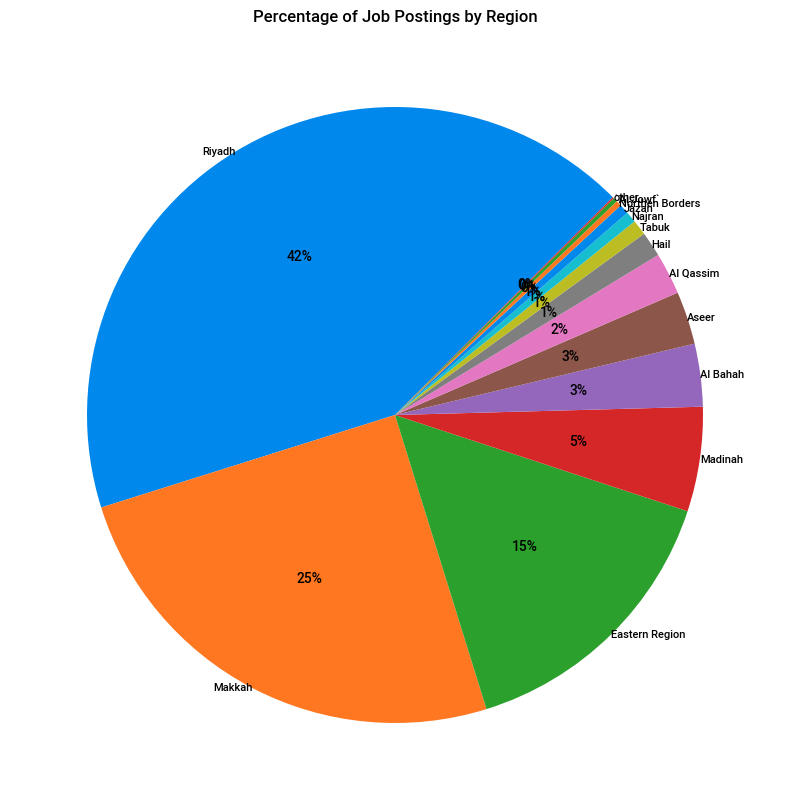

In [143]:
fig, ax = plt.subplots(figsize=(12, 10))
ax.pie(
    x=reg.values,
    labels=reg.index,
    autopct='%1.0f%%',
    startangle=45,
    labeldistance=True
)


ax.set_title("Percentage of Job Postings by Region")

plt.show()
fig.savefig('job_postings_by_region.png')

#### Q2

In [70]:
Gender_count=job['gender'].value_counts()

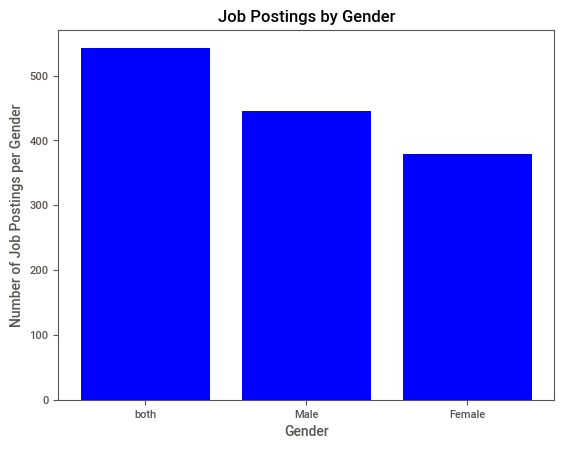

In [144]:
fig, ax = plt.subplots()

ax.bar(Gender_count.index, Gender_count.values, color='blue') 

ax.set_ylabel("Number of Job Postings per Gender")
ax.set_xlabel("Gender")
ax.set_title("Job Postings by Gender")  


plt.show()


fig.savefig('job_postings_by_gender.png') 


#### Q3

In [82]:
job.columns

Index(['job_title', 'comp_name', 'comp_type', 'region', 'city', 'salary',
       'contract', 'positions', 'years_of_experience', 'gender'],
      dtype='object')

In [97]:
fresh

,job_title,comp_name,comp_type,region,city,salary,contract,positions,years_of_experience,gender
0,محاسب,شركة مقر العالم للسفريات,خاص,Riyadh,AR RIYADH,5000.0,دوام كامل,1,0,both
1,بائع,شركة عالم الكهرباء للمقاولات,خاص,Eastern Region,AD DAMMAM,5000.0,دوام كامل,3,0,both
3,ميكانيكي سيارات,مؤسسة لمكو لغيار الزيوت,خاص,Eastern Region,AL HUFUF,5000.0,دوام كامل,10,0,Male
4,محاسب,مؤسسة فكرة اليمامة للمقاولات,خاص,Riyadh,AR RIYADH,5000.0,دوام كامل,1,0,both
5,مراقب كاميرات أمنية,مطاعم تراث الدمشقية للوجبات السريعة,خاص,Riyadh,AR RIYADH,4500.0,عمل عن بعد,1,0,both
...,...,...,...,...,...,...,...,...,...,...
1460,كيميائي,شركة نواف صالح البطي للتجارة,خاص,Riyadh,AR RIYADH,5000.0,دوام كامل,1,0,Female
1462,سكرتير قانوني,شركة النصرة للمحاماة والاستشارات القانونية شرك...,خاص,Eastern Region,AL KHUBAR,4000.0,دوام كامل,1,0,Male
1463,بائع,مؤسسة مصلح دخيل الله صالح الثبيتي للتجارة,خاص,Makkah,MAKKAH AL,4000.0,دوام كامل,1,0,Male
1465,مهندس تقنية معلومات,مطعم الاوراق الخضر لتقديم الوجبات,خاص,Riyadh,AR RIYADH,5500.0,دوام كامل,1,0,both


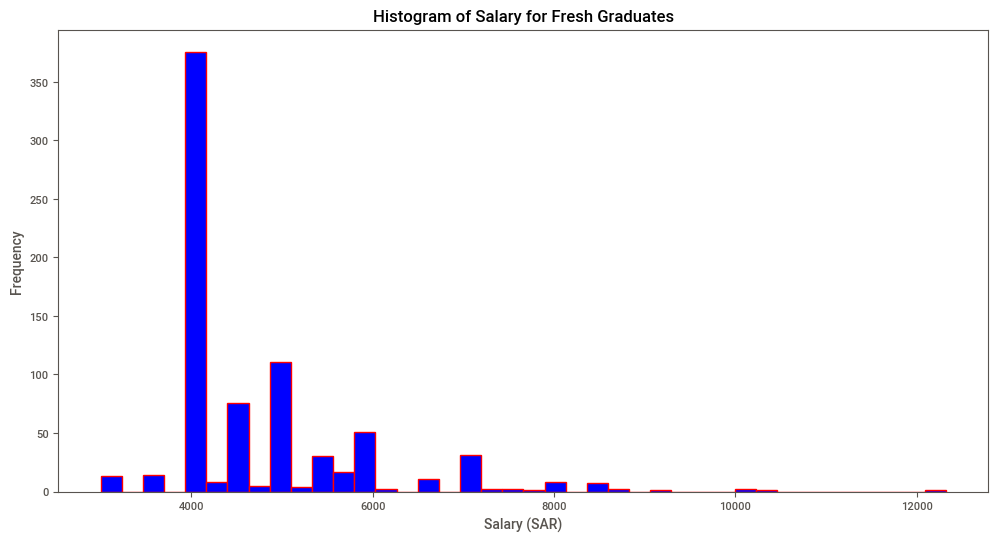

In [152]:
fresh= job[job['years_of_experience']== 0]
fresh
plt.figure(figsize=(12, 6))  

plt.hist(fresh['salary'],
         bins=40,            
         facecolor='blue',  
         edgecolor='red'     
        )
plt.xlabel('Salary (SAR)')
plt.ylabel('Frequency')
plt.title('Histogram of Salary for Fresh Graduates')



plt.savefig('histogram_salary_fresh_graduates.png')
plt.show()

#### Q4

In [93]:
exp=job['years_of_experience'].value_counts()

<Figure size 640x480 with 0 Axes>

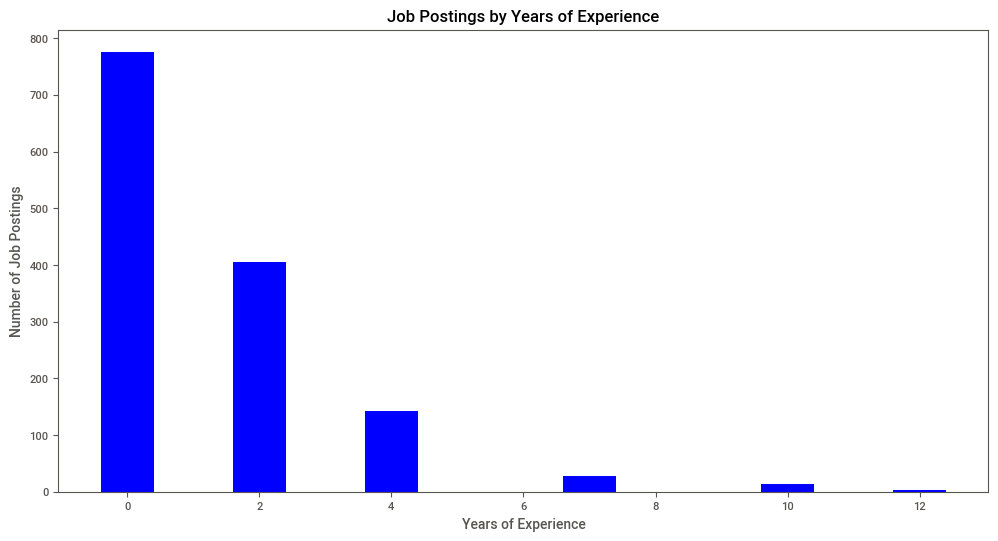

In [151]:
plt.figure(figsize=(12, 6)) 

plt.bar(exp.index,            
         exp.values,          
         color='blue'        
        )

plt.ylabel("Number of Job Postings")
plt.xlabel("Years of Experience")
plt.title("Job Postings by Years of Experience")

plt.show()

In [120]:
jobs_report = job.profile_report(
    explorative=True, html={"style": {"full_width": True}}
)
jobs_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [135]:
job.to_csv('data.csv', index=False)

### streamlit

In [132]:
st.dataframe(job)

DeltaGenerator()

In [133]:
st.title('Fresh Graduates Job Hunting: Understanding the Job Market Landscape in Saudi Arabia')

st.markdown("""
### Looking for a job as a fresh graduate or professional? Get a full understanding of Saudi Arabia's job market.
Entering adulthood after graduation and beginning your job search can feel overwhelming, especially when you're not familiar with the job market. 
Questions like *"Which cities have more opportunities?"* and *"What salary should I expect as a fresh graduate?"* may come to mind.
Don't worry, by the end of this, you'll have some clarity and answers to guide your job search.
""")


st.markdown("""
### First, let's find out which cities have the most job postings.
Understanding which cities have more job opportunities is an important first step in your job search.
""")
fig1, ax = plt.subplots(figsize=(12, 10))

ax.pie(x=reg.values, labels=reg.index, autopct='%1.0f%%', startangle=45)
ax.set_title("Percentage of Job Postings by Region")

st.pyplot(fig1.figure)

st.markdown("""
As you can see, Riyadh should be at the top of your list, with **42%** of the total job postings coming from companies there. 
Next is Makkah with **25%**, followed by the Eastern Region with **15%**. Consider these statistics when planning your job search.
""")


st.markdown("""
### Does your experience impact job opportunities?
You might be wondering, *"If I don’t have any experience, will I still be able to get a job?"*
Let's explore this question with the chart below.
""")

fig4, ax = plt.subplots()
ax.bar(exp.index, exp.values, color='blue')
ax.set_ylabel("Job Postings")
ax.set_xlabel("Years of Experience")
ax.set_title("Job Postings by Years of Experience")


st.pyplot(fig4)

st.markdown("""
As shown above, job postings for fresh graduates (with zero experience) are still significant. 
There's a growing focus on creating opportunities for graduates, aligned with Saudi Arabia's Vision 2030 goals. 
So relax and know that there are plenty of opportunities available for you as a fresh graduate.
""")

st.markdown("""
### What salary should you expect as a fresh graduate?
We all aim for high salaries, but before deciding on your minimum salary, take a look at the chart below for some context.
""")

fig3, ax = plt.subplots()
ax.hist(fresh['salary'], bins=40, color='blue', edgecolor='black')
ax.set_xlabel('Salary (SAR)')
ax.set_ylabel('Frequency')
ax.set_title('Salary Distribution for Fresh Graduates')

st.pyplot(fig3)

st.markdown("""
As you can see, the salary for fresh graduates typically ranges between **4000 SAR** to **6000 SAR**. 
While it might feel a bit disappointing at first, remember this is just the beginning of your career, and your salary will grow as you gain more experience.
""")

st.markdown("""
### Does gender affect job opportunities?
There's often debate and controversy around whether being male or female impacts job opportunities. 
Let’s end this debate with one simple chart.
""")

fig2, ax = plt.subplots()
ax.bar(Gender_count.index, Gender_count.values, color='blue')
ax.set_ylabel("Number of Job Postings")
ax.set_xlabel("Gender")

st.pyplot(fig2)

st.markdown("""
As you can see from the chart, there's not much difference between the number of job postings for males and females. 
Let’s put this debate to rest—gender isn't as big of a factor as some may believe.
""")

st.markdown("""
### Final advice...
Finding a job may not always be easy, but with a clear set of short-term and long-term goals, 
an understanding of the job market, and a well-planned approach, you’ll find the process more manageable.
Stay patient, and keep pushing toward your goals. 
Good luck!
""")

DeltaGenerator()